[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/1ZqERMPJXKc8BF1ktFg7-WqW4AkQspZBm?usp=sharing)

# Conformal prediction for computer vision
(based on Anastasios Angelopoulos' notebooks https://github.com/aangelopoulos/conformal-prediction/tree/main/notebooks)

In [1]:
import os
import json
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.image import imread
!pip install -U --no-cache-dir gdown --pre

## Data preparation

### Load the data

In [2]:
# Load cached data
if not os.path.exists('../data'):
    os.system('gdown 1h7S6N_Rx7gdfO3ZunzErZy6H7620EbZK -O ../data.tar.gz')
    os.system('tar -xf ../data.tar.gz -C ../')
    os.system('rm ../data.tar.gz')
if not os.path.exists('../data/imagenet/human_readable_labels.json'):
    !wget -nv -O ../data/imagenet/human_readable_labels.json -L https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json

data = np.load('../data/imagenet/imagenet-resnet152.npz')
example_paths = os.listdir('../data/imagenet/examples')
smx = data['smx']
labels = data['labels'].astype(int)

### Setting parameters for conformal prediction

In [3]:
# Problem setup
n_cal = 1000 # number of calibration points
alpha = 0.1 # 1-alpha is the desired coverage

### Splitting the data

In [4]:
type(smx)

numpy.ndarray

In [5]:
smx.shape

(50000, 1000)

In [6]:
# Split the softmax scores into calibration and validation sets (save the shuffling)
idx = np.array([1] * n_cal + [0] * (smx.shape[0]-n_cal)) > 0
idx

array([ True,  True,  True, ..., False, False, False])

In [7]:
np.random.seed(42)
np.random.shuffle(idx)
cal_smx, test_smx = smx[idx,:], smx[~idx,:]
cal_labels, test_labels = labels[idx], labels[~idx]

### Understanding what is stored in the data

In [8]:
test_labels.shape

(49000,)

In [9]:
cal_labels.shape

(1000,)

The first 10 labels in the calibration set are  [0 0 1 3 5 6 6 6 7 9]
The minimal label is  0
The maximal label is  999


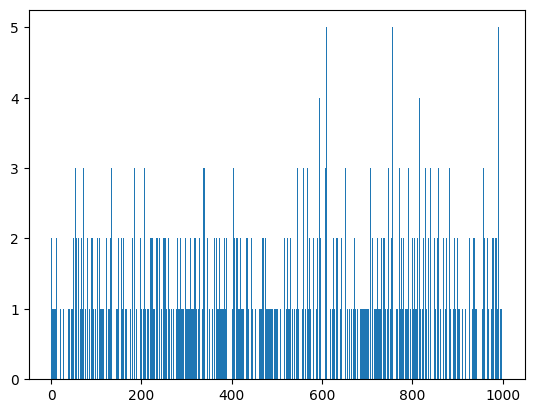

In [10]:
# Zoom on the labels in the calibration set
print("The first 10 labels in the calibration set are ", cal_labels[:10])
print("The minimal label is ",np.min(cal_labels))
print("The maximal label is ",np.max(cal_labels))
plt.hist(cal_labels,bins=1000);

The first 10 labels in the test set are  [0 0 0 0 0 0 0 0 0 0]
The minimal label is  0
The maximal label is  999


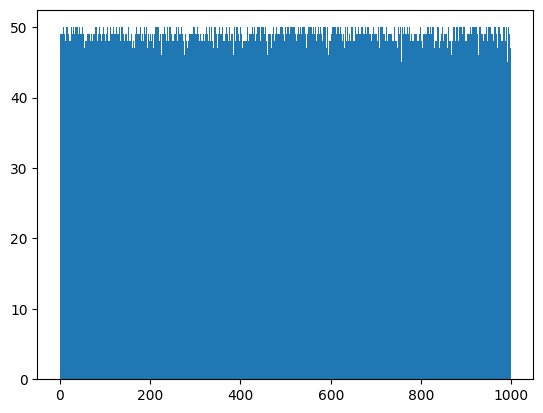

In [11]:
# Zoom on the labels in the test set
print("The first 10 labels in the test set are ", test_labels[:10])
print("The minimal label is ",np.min(test_labels))
print("The maximal label is ",np.max(test_labels))
plt.hist(test_labels,bins=1000);

In [12]:
print("The total number of different labels in the dataset:",len(np.unique(labels)))

The total number of different labels in the dataset: 1000


The sum of a row of cal_smx gives  0.9999999642681061


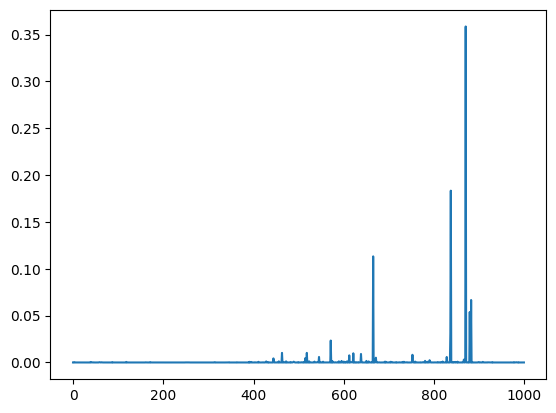

In [13]:
# Look at a row of cal_smx: this corresponds to the predicted probabilities
# (the training has been already performed)
plt.plot(cal_smx[450])
print("The sum of a row of cal_smx gives ",np.sum(cal_smx[450]))

### A first way for conformal prediction

<div class="alert alert-block alert-info">
    1. For each calibration point, compute a score. <br>
    2. And then evaluate an empirical quantile of the calibration scores.  
</div>



In [14]:
# 1: get non-conformity scores using hinge loss
cal_scores = 1-cal_smx[np.arange(n_cal),cal_labels]

In [15]:
cal_scores[:20]

array([6.41689777e-01, 3.40580940e-04, 6.41055703e-02, 9.99865802e-01,
       5.47298789e-02, 2.35717893e-02, 6.09320402e-03, 3.33090365e-01,
       6.46929324e-01, 1.33633614e-04, 1.03235245e-04, 9.24706459e-04,
       7.72356987e-04, 1.80238485e-03, 6.89352751e-02, 9.39071178e-04,
       2.25394964e-03, 2.85923481e-04, 9.09763575e-03, 1.79862976e-03])

In [16]:
# 2: get adjusted quantile on nonconformity scores
q_level = np.ceil((n_cal+1)*(1-alpha))/n_cal
qhat = np.quantile(cal_scores, q_level, method='higher')

<div class="alert alert-block alert-info">
    3. Form the prediction sets for the test set
</div>

In [17]:
test_smx

array([[5.55347383e-01, 1.32564350e-03, 5.25403069e-04, ...,
        1.47947849e-05, 3.24599205e-05, 1.63325603e-06],
       [9.64658678e-01, 1.35036071e-05, 2.15132957e-07, ...,
        8.14401858e-07, 1.33911101e-07, 6.87838053e-09],
       [9.99836087e-01, 1.79859434e-08, 4.87714402e-09, ...,
        1.26598288e-05, 4.91699197e-08, 1.86872757e-11],
       ...,
       [1.57358859e-09, 4.43931967e-08, 7.34767447e-09, ...,
        8.11502957e-07, 1.32755105e-07, 8.50005984e-01],
       [9.93386379e-07, 1.08330059e-04, 1.62448850e-05, ...,
        3.21692278e-05, 3.94053168e-05, 1.20624267e-01],
       [5.22422567e-08, 3.57574663e-07, 4.72474085e-07, ...,
        1.06125162e-06, 5.35718618e-06, 1.40896440e-01]])

In [18]:
# 3: form prediction sets
prediction_sets = test_smx >= (1-qhat)


In [19]:
prediction_sets.shape

(49000, 1000)

In [20]:
prediction_sets

array([[ True, False, False, ..., False, False, False],
       [ True, False, False, ..., False, False, False],
       [ True, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False,  True],
       [False, False, False, ..., False, False,  True],
       [False, False, False, ..., False, False,  True]])

<div class="alert alert-block alert-info">
    4. Compute the empirical coverage
</div>

In [21]:
# Calculate empirical coverage
empirical_coverage = prediction_sets[np.arange(prediction_sets.shape[0]),test_labels].mean()
print(f"The empirical coverage is: {empirical_coverage}")

The empirical coverage is: 0.894469387755102


<div class="alert alert-block alert-info">
    5. Illustrate prediction sets for some points of the test set
</div>

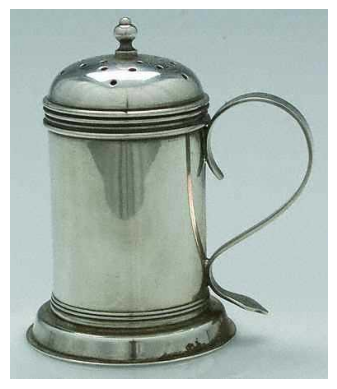

The prediction set is: ['coffeemaker']


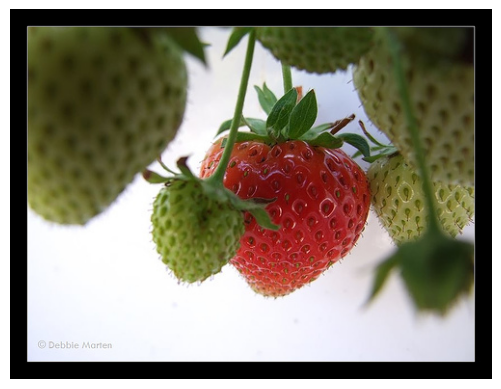

The prediction set is: ['strawberry']


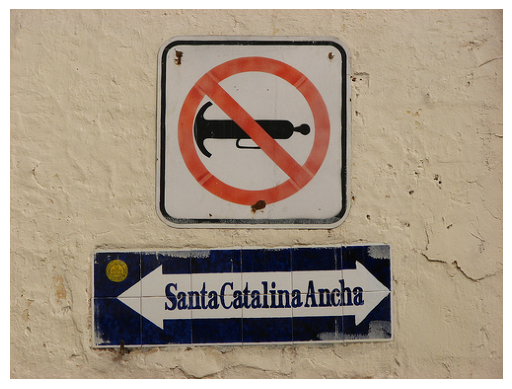

The prediction set is: ['traffic sign']


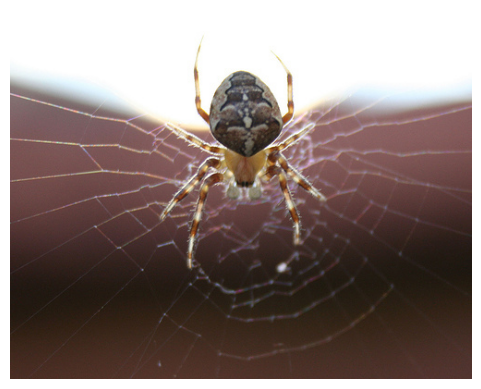

The prediction set is: ['harvestman', 'barn spider', 'European garden spider', 'spider web']


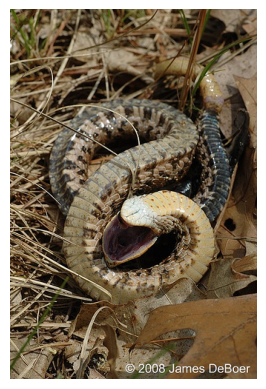

The prediction set is: ['eastern hog-nosed snake']


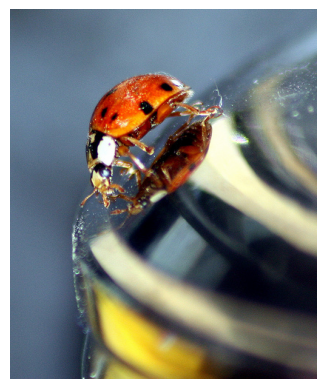

The prediction set is: ['ladybug']


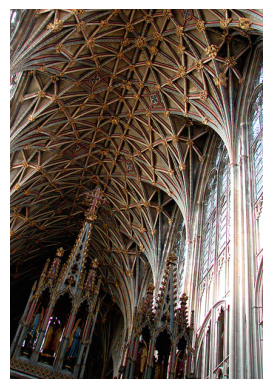

The prediction set is: ['vault']


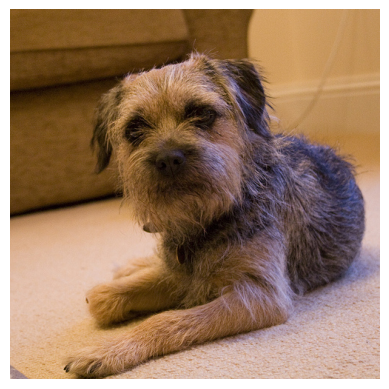

The prediction set is: ['Border Terrier']


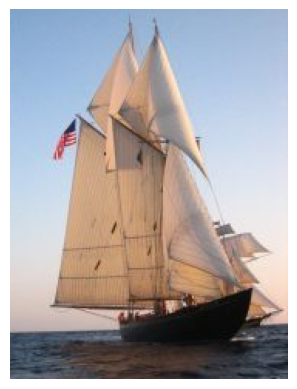

The prediction set is: ['schooner', 'yawl']


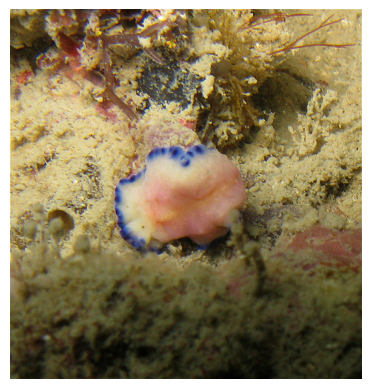

The prediction set is: ['flatworm', 'sea slug']


In [22]:
# Making the labels human-readable
with open('../data/imagenet/human_readable_labels.json') as f:
    label_strings = np.array(json.load(f))

# Show some examples
example_paths =os.listdir('../data/imagenet/examples')
for i in range(10):
    rand_path = np.random.choice(example_paths)
    img = imread('../data/imagenet/examples/' + rand_path )
    img_index = int(rand_path.split('.')[0])
    #
    prediction_set = smx[img_index] > 1-qhat #TODO OPERAND
    #
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    plt.show()
    print(f"The prediction set is: {list(label_strings[prediction_set])}")

<div class="alert alert-block alert-success">This method leads to <b>small prediction sets</b>, but sacrifices <b>adaptivity</b>. </div>



## Adaptive Prediction Sets (APS)

<div class="alert alert-block alert-info">
    <ol>
<li>Sort in decreasing order $\hat{p}_{\sigma_i(1)}(X_i) \geq ... \geq  \hat{p}_{\sigma_i(C)}(X_i)$</li>
   
<li> Compute the calibration scores $S_i = \sum_{k=1}^{\sigma_i^{-1}(Y_i)} \hat{p}_{\sigma_i(k)}(X_i)$ (sum of the estimated probabilities associated to classes at least as large as that of the true class $Y_i$)} </li>
    <li> Get the quantile $q_{1-\alpha}(\mathcal{S})$ </li>
<li> Return the classes $\sigma_{\text{new}}(1),... ,\sigma_{\text{new}}(r^\star)$ where $r^{\star} = \text{argmax}_{1 \leq r \leq C}\left\{ \sum_{k=1}^{r} \hat{p}_{\sigma_{\text{new}}(k)}(X_{\text{new}}) < q_{1-\alpha}(\mathcal{S}) \right\} + 1$</li>
         </ol>

NB : to avoid the +1, you can use the corrected quantile ;)

In [23]:
cal_smx.shape

(1000, 1000)

In [24]:
# Get scores. calib_X.shape[0] == calib_Y.shape[0] == n
cal_pi = cal_smx.argsort(1)[:, ::-1]
cal_srt = np.take_along_axis(cal_smx, cal_pi, axis=1).cumsum(axis=1)
cal_scores = np.take_along_axis(cal_srt, cal_pi.argsort(axis=1), axis=1)[
    range(n_cal), cal_labels
]
# Get the score quantile
qhat = np.quantile(
    cal_scores, np.ceil((n_cal + 1) * (1 - alpha)) / n_cal, method="higher"
)
# Deploy (output=list of length n, each element is tensor of classes)
test_pi = test_smx.argsort(1)[:, ::-1]
test_srt = np.take_along_axis(test_smx, test_pi, axis=1).cumsum(axis=1)
prediction_sets = np.take_along_axis(test_srt <= qhat, test_pi.argsort(axis=1), axis=1)

In [25]:
# Calculate empirical coverage
empirical_coverage = prediction_sets[
    np.arange(prediction_sets.shape[0]), test_labels
].mean()
print(f"The empirical coverage is: {empirical_coverage}")


The empirical coverage is: 0.8972857142857142


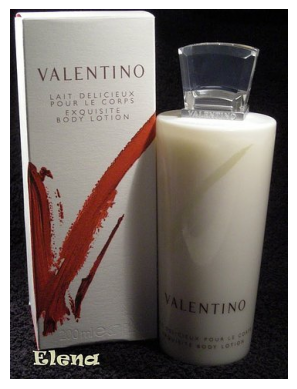

The prediction set is: ['goldfinch', 'magpie', 'hummingbird', 'toucan', 'conch', 'Dungeness crab', 'red king crab', 'American lobster', 'spiny lobster', 'crayfish', 'king penguin', 'cockroach', 'sea cucumber', 'abaya', 'accordion', 'altar', 'analog clock', 'waste container', 'bakery', 'ballpoint pen', 'Band-Aid', 'barometer', 'barrel', 'beaker', 'military cap', 'beer bottle', 'beer glass', 'ring binder', 'binoculars', 'bolo tie', 'bookstore', 'bottle cap', 'brass', 'bra', 'bucket', 'candle', 'can opener', 'tool kit', 'carton', 'cassette', 'cassette player', 'mobile phone', 'chain', 'chain-link fence', 'cleaver', 'cocktail shaker', 'coffee mug', 'coffeemaker', 'corkscrew', 'cowboy hat', 'Crock Pot', 'desktop computer', 'digital clock', 'dishwasher', 'drumstick', 'envelope', 'espresso machine', 'face powder', 'feather boa', 'fountain pen', 'goblet', 'hair spray', 'hammer', 'hamper', 'hair dryer', 'hard disk drive', 'hook', 'hourglass', 'iPod', 'knot', 'lab coat', 'ladle', 'lampshade', 'l

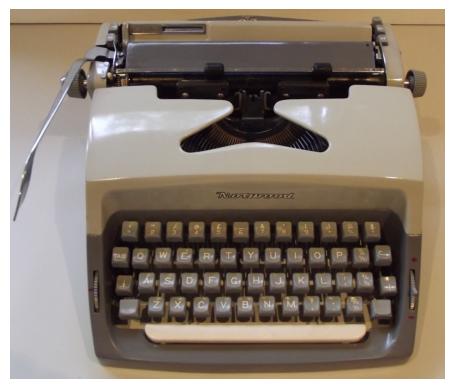

The prediction set is: ['space bar']


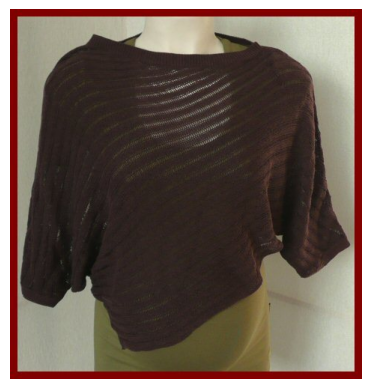

The prediction set is: ['abaya', 'apron', 'breastplate', 'bulletproof vest', 'cardigan', 'chain mail', 'cloak', 'cowboy hat', 'crutch', 'cuirass', 'feather boa', 'fur coat', 'gas mask', 'gown', 'grand piano', 'hair spray', 'hamper', 'hair dryer', 'hoop skirt', 'jeans', 'T-shirt', 'kimono', 'mail bag', 'tights', 'tank suit', 'marimba', 'mask', 'miniskirt', 'neck brace', 'overskirt', 'pajamas', 'paper towel', 'photocopier', 'plunger', 'poncho', "potter's wheel", 'quilt', 'radiator', 'sarong', 'sewing machine', 'shower cap', 'ski mask', 'sombrero', 'scarf', 'strainer', 'sunglasses', 'mop', 'sweatshirt', 'trench coat', 'velvet', 'wig', 'wool']


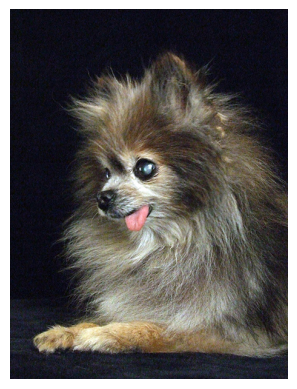

The prediction set is: ['Chihuahua', 'Papillon', 'Pomeranian', 'Keeshond']


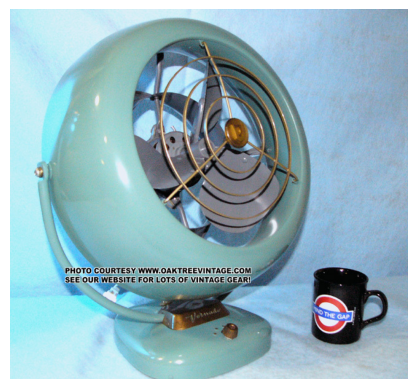

The prediction set is: ['electric ray', 'brambling', 'goldfinch', 'house finch', 'junco', 'jay', 'worm snake', 'ring-necked snake', 'smooth green snake', 'garter snake', 'water snake', 'vine snake', 'night snake', 'Indian cobra', 'green mamba', 'sidewinder', 'trilobite', 'harvestman', 'barn spider', 'southern black widow', 'tick', 'centipede', 'ruffed grouse', 'quail', 'partridge', 'grey parrot', 'hummingbird', 'platypus', 'jellyfish', 'sea anemone', 'nematode', 'conch', 'snail', 'sea slug', 'chiton', 'chambered nautilus', 'Dungeness crab', 'spiny lobster', 'crayfish', 'hermit crab', 'isopod', 'common gallinule', 'ruddy turnstone', 'sea lion', 'Shih Tzu', 'Tibetan Terrier', 'Soft-coated Wheaten Terrier', 'Lhasa Apso', 'Labrador Retriever', 'Chesapeake Bay Retriever', 'Schipperke', 'Rottweiler', 'Tibetan Mastiff', 'pug', 'Pomeranian', 'Toy Poodle', 'tabby cat', 'tiger cat', 'Siamese cat', 'Egyptian Mau', 'bee', 'ant', 'cicada', 'hamster', 'weasel', 'mink', 'European polecat', 'black-foo

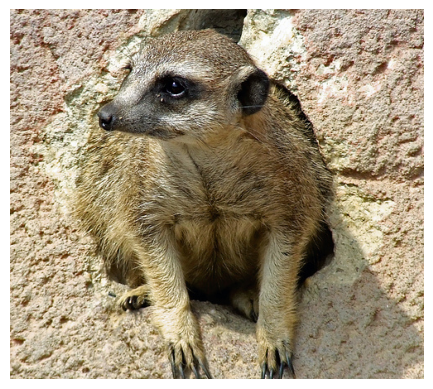

The prediction set is: ['wallaby', 'mongoose', 'meerkat', 'marmot', 'badger', 'ring-tailed lemur']


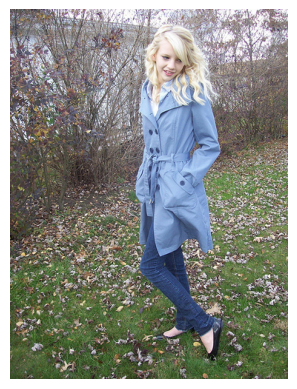

The prediction set is: ['tench', 'worm snake', 'tick', 'goose', 'wallaby', 'slug', 'Chihuahua', 'Shih Tzu', 'King Charles Spaniel', 'Rhodesian Ridgeback', 'Afghan Hound', 'Bloodhound', 'Treeing Walker Coonhound', 'Redbone Coonhound', 'borzoi', 'Irish Wolfhound', 'Italian Greyhound', 'Whippet', 'Ibizan Hound', 'Norwegian Elkhound', 'Saluki', 'Scottish Deerhound', 'Weimaraner', 'Staffordshire Bull Terrier', 'American Staffordshire Terrier', 'Bedlington Terrier', 'Border Terrier', 'Kerry Blue Terrier', 'Irish Terrier', 'Norfolk Terrier', 'Norwich Terrier', 'Yorkshire Terrier', 'Wire Fox Terrier', 'Lakeland Terrier', 'Airedale Terrier', 'Cairn Terrier', 'Boston Terrier', 'Miniature Schnauzer', 'Giant Schnauzer', 'Standard Schnauzer', 'Scottish Terrier', 'Australian Silky Terrier', 'Soft-coated Wheaten Terrier', 'West Highland White Terrier', 'Lhasa Apso', 'Flat-Coated Retriever', 'Curly-coated Retriever', 'Golden Retriever', 'Labrador Retriever', 'Vizsla', 'English Setter', 'Irish Setter',

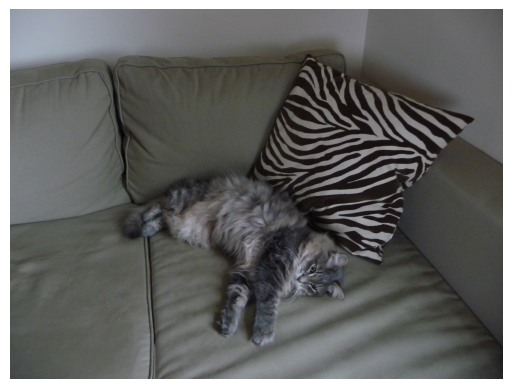

The prediction set is: ['tiger shark', 'ostrich', 'house finch', 'vulture', 'great grey owl', 'leatherback sea turtle', 'Gila monster', 'triceratops', 'Saharan horned viper', 'eastern diamondback rattlesnake', 'tarantula', 'grey parrot', 'platypus', 'wombat', 'chambered nautilus', 'ruddy turnstone', 'dunlin', 'Chihuahua', 'Japanese Chin', 'Maltese', 'Pekingese', 'Shih Tzu', 'King Charles Spaniel', 'Papillon', 'toy terrier', 'Rhodesian Ridgeback', 'Afghan Hound', 'Basset Hound', 'Bloodhound', 'Bluetick Coonhound', 'Black and Tan Coonhound', 'Redbone Coonhound', 'borzoi', 'Irish Wolfhound', 'Italian Greyhound', 'Whippet', 'Norwegian Elkhound', 'Otterhound', 'Saluki', 'Scottish Deerhound', 'Weimaraner', 'Staffordshire Bull Terrier', 'American Staffordshire Terrier', 'Bedlington Terrier', 'Border Terrier', 'Kerry Blue Terrier', 'Irish Terrier', 'Norfolk Terrier', 'Norwich Terrier', 'Yorkshire Terrier', 'Wire Fox Terrier', 'Lakeland Terrier', 'Sealyham Terrier', 'Airedale Terrier', 'Cairn T

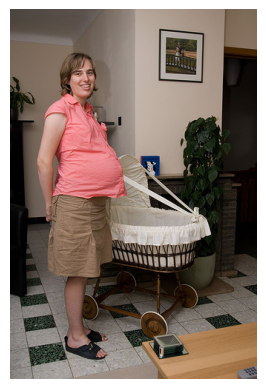

The prediction set is: ['bassinet', 'cradle']


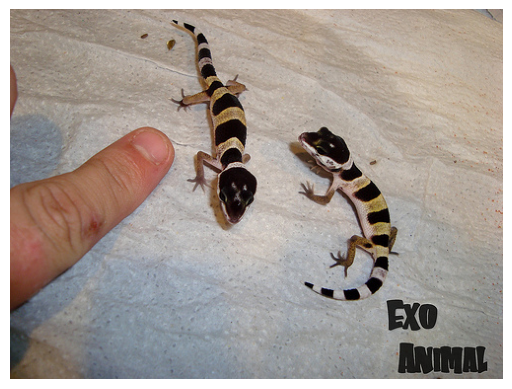

The prediction set is: ['banded gecko', 'kingsnake']


In [26]:
# Show some examples
with open("../data/imagenet/human_readable_labels.json") as f:
    label_strings = np.array(json.load(f))

example_paths = os.listdir("../data/imagenet/examples")
for i in range(10):
    rand_path = np.random.choice(example_paths)
    img = imread("../data/imagenet/examples/" + rand_path)
    img_index = int(rand_path.split(".")[0])
    img_pi = smx[img_index].argsort()[::-1]
    img_srt = np.take_along_axis(smx[img_index], img_pi, axis=0).cumsum()
    prediction_set = np.take_along_axis(img_srt <= qhat, img_pi.argsort(), axis=0)
    plt.figure()
    plt.imshow(img)
    plt.axis("off")
    plt.show()
    print(f"The prediction set is: {list(label_strings[prediction_set])}")


## RAPS


[Notebook source](https://github.com/aangelopoulos/conformal-prediction/blob/main/notebooks/imagenet-raps.ipynb)

In [27]:
# Set RAPS regularization parameters (larger lam_reg and smaller k_reg leads to smaller sets)
lam_reg = 0.01
k_reg = 5
disallow_zero_sets = False # Set this to False in order to see the coverage upper bound hold
rand = True # Set this to True in order to see the coverage upper bound hold
reg_vec = np.array(k_reg*[0,] + (smx.shape[1]-k_reg)*[lam_reg,])[None,:] # create a row with 5 zeroes and the rest at 0.01

In [28]:
# Get scores. calib_X.shape[0] == calib_Y.shape[0] == n

cal_pi = cal_smx.argsort(1)[:,::-1];
cal_srt = np.take_along_axis(cal_smx,cal_pi,axis=1)
cal_srt_reg = cal_srt + reg_vec
cal_L = np.where(cal_pi == cal_labels[:,None])[1]
cal_scores = cal_srt_reg.cumsum(axis=1)[np.arange(n_cal),cal_L] - np.random.rand(n_cal)*cal_srt_reg[np.arange(n_cal),cal_L]

# Get the score quantile
qhat = np.quantile(cal_scores, np.ceil((n_cal+1)*(1-alpha))/n_cal, method='higher')

# Deploy
n_test = test_smx.shape[0]
test_pi = test_smx.argsort(1)[:,::-1]
test_srt = np.take_along_axis(test_smx,test_pi,axis=1)
test_srt_reg = test_srt + reg_vec
test_srt_reg_cumsum = test_srt_reg.cumsum(axis=1)
indicators = (test_srt_reg.cumsum(axis=1) - np.random.rand(n_test,1)*test_srt_reg) <= qhat if rand else test_srt_reg.cumsum(axis=1) -test_srt_reg <= qhat
if disallow_zero_sets: indicators[:,0] = True
prediction_sets = np.take_along_axis(indicators,test_pi.argsort(axis=1),axis=1)

In [29]:
# Calculate empirical coverage
empirical_coverage = prediction_sets[np.arange(n_test),test_labels].mean()
print(f"The empirical coverage is: {empirical_coverage}")
print(f"The quantile is: {qhat}")

The empirical coverage is: 0.8960408163265307
The quantile is: 0.9460060951042203


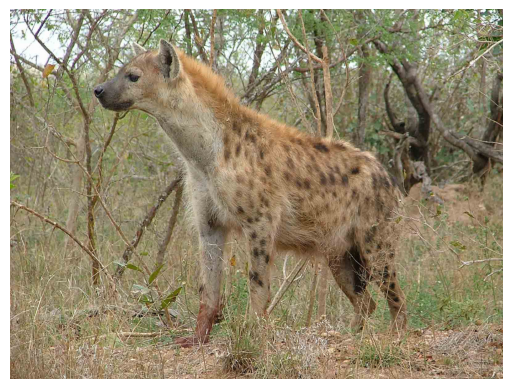

The prediction set is: ['hyena']


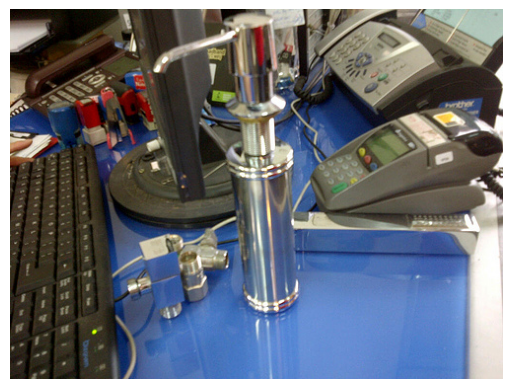

The prediction set is: ['barbell', 'barber chair', 'beaker', 'ring binder', 'binoculars', 'desk', 'dumbbell', 'joystick', 'lighter', 'microphone', 'oscilloscope', 'Petri dish', 'power drill', 'weighing scale', 'screwdriver', 'sewing machine', 'soap dispenser', 'mop', 'turnstile', 'sink']


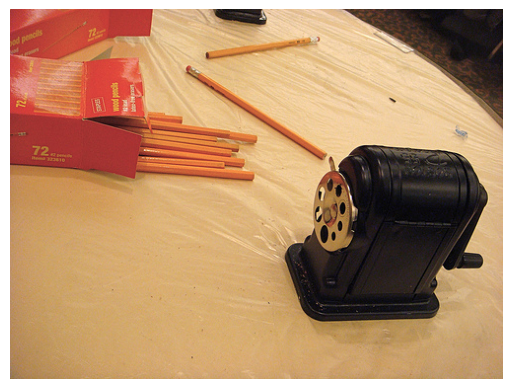

The prediction set is: ['pencil sharpener']


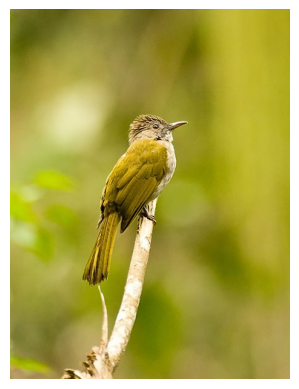

The prediction set is: ['bulbul', 'bee eater', 'hummingbird', 'jacamar']


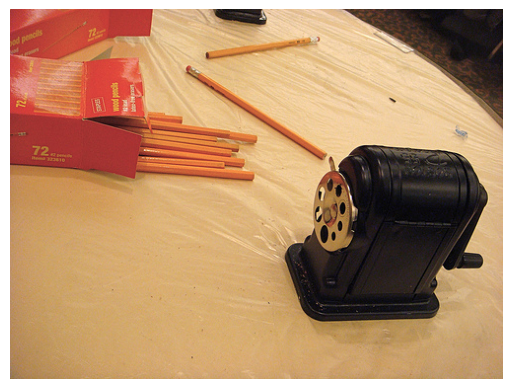

The prediction set is: ['pencil sharpener']


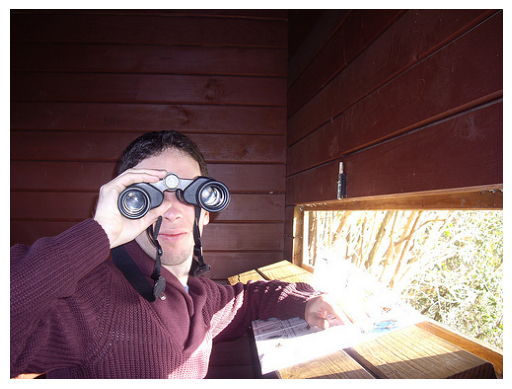

The prediction set is: ['binoculars']


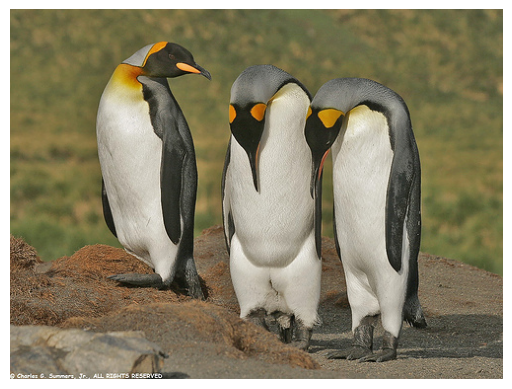

The prediction set is: ['king penguin']


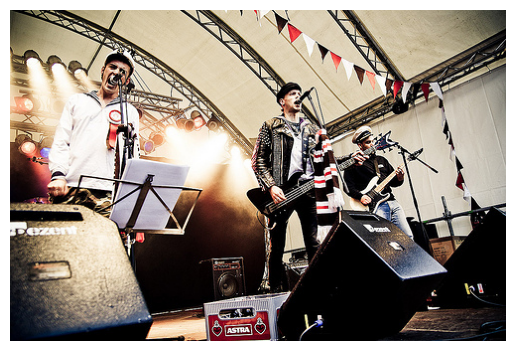

The prediction set is: ['stage']


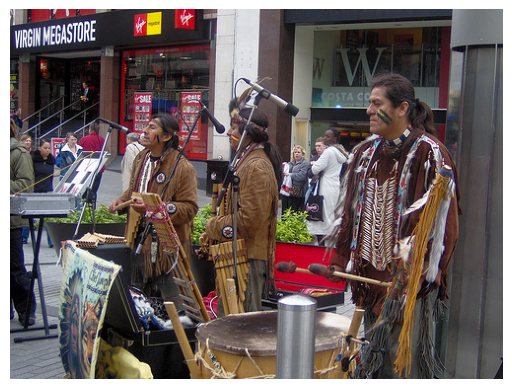

The prediction set is: ['pan flute']


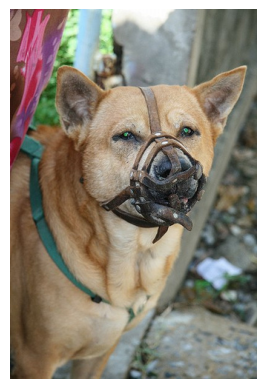

The prediction set is: ['muzzle']


In [30]:
# Show some examples
with open('../data/imagenet/human_readable_labels.json') as f:
    label_strings = np.array(json.load(f))

example_paths =os.listdir('../data/imagenet/examples')
for i in range(10):
    rand_path = np.random.choice(example_paths)
    img = imread('../data/imagenet/examples/' + rand_path )
    img_index = int(rand_path.split('.')[0])
    # Form the prediction set
    _smx = smx[img_index]
    _pi = np.argsort(_smx)[::-1]
    _srt = np.take_along_axis(_smx,_pi,axis=0)
    _srt_reg = _srt + reg_vec.squeeze()
    _srt_reg_cumsum = _srt_reg.cumsum()
    _ind = (_srt_reg_cumsum - np.random.rand()*_srt_reg) <= qhat if rand else _srt_reg_cumsum - _srt_reg <= qhat
    if disallow_zero_sets: _ind[0] = True
    prediction_set = np.take_along_axis(_ind,_pi.argsort(),axis=0)
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    plt.show()
    print(f"The prediction set is: {list(label_strings[prediction_set])}")